# Setup

In [74]:
import numpy as np
import plotly.graph_objects as go
from torch import Tensor
import einops
import itertools
from joblib import Parallel, delayed

# Setup
import os
import sys
from functools import partial
from pathlib import Path
from typing import Callable

import einops
import plotly.express as px
import plotly.graph_objects as go
import torch as t
from IPython.display import display
from ipywidgets import interact
from jaxtyping import Bool, Float
from torch import Tensor
from tqdm import tqdm

# Make sure exercises are in the path
chapter = "chapter0_fundamentals"
section = "part1_ray_tracing"
#root_dir = next(p for p in Path.cwd().parents if (p / chapter).exists())
root_dir = Path("/Users/sebastin/Documents/perso/ARENA_training/ARENA_3.0")
exercises_dir = root_dir / chapter / "exercises"
section_dir = exercises_dir / section
if str(exercises_dir) not in sys.path:
    sys.path.append(str(exercises_dir))

import part1_ray_tracing.tests as tests
from part1_ray_tracing.utils import (
    render_lines_with_plotly,
    setup_widget_fig_ray,
    setup_widget_fig_triangle,
)
from plotly_utils import imshow

MAIN = __name__ == "__main__"

In [2]:
fig: go.FigureWidget = setup_widget_fig_ray()
display(fig)


@interact(v=(0.0, 6.0, 0.01), seed=(0, 10, 1))
def update(v=0.0, seed=0):
    t.manual_seed(seed)
    L_1, L_2 = t.rand(2, 2)
    P = lambda v: L_1 + v * (L_2 - L_1)
    x, y = zip(P(0), P(6))
    with fig.batch_update():
        fig.update_traces({"x": x, "y": y}, 0)
        fig.update_traces({"x": [L_1[0], L_2[0]], "y": [L_1[1], L_2[1]]}, 1)
        fig.update_traces({"x": [P(v)[0]], "y": [P(v)[1]]}, 2)


FigureWidget({
    'data': [{'type': 'scatter', 'uid': '0bd2cf53-b189-477b-91f8-c5cf6a87fd58', 'x': [], 'y': []},
             {'marker': {'size': 12},
              'mode': 'markers',
              'name': 'v=0',
              'type': 'scatter',
              'uid': '6d494827-72e4-4d8b-8f4f-19dbf4933839',
              'x': [],
              'y': []},
             {'marker': {'size': 12, 'symbol': 'x'},
              'mode': 'markers',
              'name': 'v=1',
              'type': 'scatter',
              'uid': '8d9d2a51-8087-4621-9380-1e938387e983',
              'x': [],
              'y': []}],
    'layout': {'height': 400,
               'margin': {'b': 10, 'l': 40, 't': 60},
               'showlegend': False,
               'template': '...',
               'title': {'text': 'Ray coordinates illustration'},
               'width': 500,
               'xaxis': {'range': [-1.5, 2.5]},
               'yaxis': {'range': [-1.5, 2.5]}}
})

interactive(children=(FloatSlider(value=0.0, description='v', max=6.0, step=0.01), IntSlider(value=0, descript…

# I. Rays & segments

## Make rays 1d

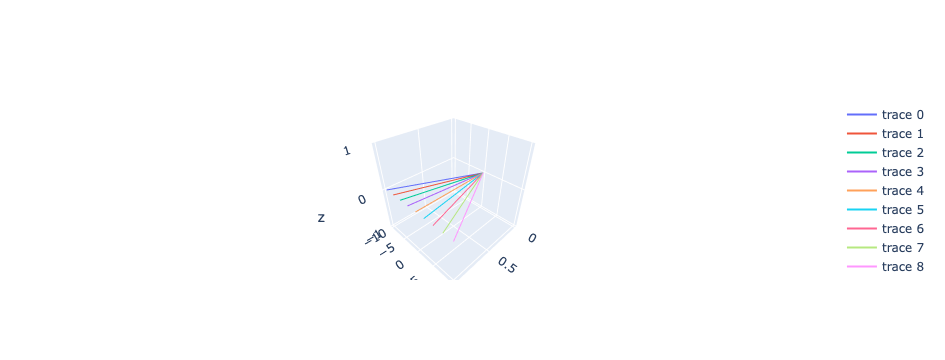

In [6]:
# Fundamentals of ray generation and rendering
def make_rays_1d(num_pixels: int, y_limit: float) -> Tensor:
    """
    num_pixels: The number of pixels in the y dimension. Since there is one ray per pixel, this is
        also the number of rays.
    y_limit: At x=1, the rays should extend from -y_limit to +y_limit, inclusive of both endpoints.

    Returns: shape (num_pixels, num_points=2, num_dim=3) where the num_points dimension contains
        (origin, direction) and the num_dim dimension contains xyz.

    Example of make_rays_1d(9, 1.0): [
        [[0, 0, 0], [1, -1.0, 0]],
        [[0, 0, 0], [1, -0.75, 0]],
        [[0, 0, 0], [1, -0.5, 0]],
        ...
        [[0, 0, 0], [1, 0.75, 0]],
        [[0, 0, 0], [1, 1, 0]],
    ]
    """
    origins = np.zeros((num_pixels, 3))  # shape (num_pixels, num_dim)
    y_values = np.linspace(-y_limit, y_limit, num_pixels)  # shape (num_pixels,)
    directions = np.stack([np.ones(num_pixels), y_values, np.zeros(num_pixels)], axis=-1)  # shape (num_pixels, num_dim)
    rays = np.stack([origins, directions], axis=1)  # shape (num_pixels, num_points=2, num_dim=3)
    return Tensor(rays)



def render_lines_with_plotly(rays: Tensor) -> go.Figure:
    """
    rays: shape (num_rays, num_points=2, num_dim=3) where the num_points dimension contains
        (origin, direction) and the num_dim dimension contains xyz.
    Returns: A plotly figure with the rays rendered as lines.
    """
    num_rays = rays.shape[0]
    fig = go.Figure()
    for i in range(num_rays):
        origin = rays[i, 0]  # shape (num_dim,)
        direction = rays[i, 1]  # shape (num_dim,)
        line_x = [origin[0].item(), origin[0].item() + direction[0].item()]
        line_y = [origin[1].item(), origin[1].item() + direction[1].item()]
        line_z = [origin[2].item(), origin[2].item() + direction[2].item()]
        fig.add_trace(go.Scatter3d(x=line_x, y=line_y, z=line_z, mode='lines'))
    fig.update_layout(scene=dict(aspectmode='cube'))
    return fig

rays1d = make_rays_1d(9, 10.0)
fig = render_lines_with_plotly(rays1d)
fig.show()


## Intersect 1d

In [36]:
#%% Closest points between two lines in 3D
def closest_points_3d(p1, d1, p2, d2):
    # p1, p2: starting points (numpy arrays)
    # d1, d2: direction vectors (numpy arrays)
    
    # Cross product of directions gives the common perpendicular
    n = np.cross(d1, d2)
    
    # If the cross product is zero, lines are parallel
    if np.linalg.norm(n) < 1e-10:
        return None, "Lines are parallel"

    # Solve the linear system for s and t
    # Using the property that the segment (L1(s) - L2(t)) is perp to d1 and d2
    # This forms a 2x2 system:
    # s(d1·d1) - t(d2·d1) = (p2-p1)·d1
    # s(d1·d2) - t(d2·d2) = (p2-p1)·d2
    
    rhs = p2 - p1
    matrix = np.array([
        [np.dot(d1, d1), -np.dot(d2, d1)],
        [np.dot(d1, d2), -np.dot(d2, d2)]
    ])
    
    s, t = np.linalg.solve(matrix, [np.dot(rhs, d1), np.dot(rhs, d2)])
    
    point1 = p1 + s * d1
    point2 = p2 + t * d2
    
    # If point1 == point2, they actually intersect!
    if np.allclose(point1, point2):
        return point1, "Perfect Intersection"
    else:
        return (point1 + point2) / 2, "Skew (Midpoint of closest approach)"

# Example
p1, d1 = np.array([0,0,0]), np.array([1,1,0])
p2, d2 = np.array([0,2,0]), np.array([1,-1,0])

point, status = closest_points_3d(p1, d1, p2, d2)
print(f"{status}: {point}")

# %%
# Ray intersection with line segments
def intersect_ray_1d(ray: Float[Tensor, "points dims"], segment: Float[Tensor, "points dims"]) -> bool:
    """
    ray: shape (n_points=2, n_dim=3)  # O, D points
    segment: shape (n_points=2, n_dim=3)  # L_1, L_2 points

    Return True if the ray intersects the segment.
    """
    O, D = ray  # Origin and Direction of the ray
    L1, L2 = segment  # Endpoints of the line segment

    # Vector from L1 to L2
    seg_vec = L2 - L1
    seg_len = t.norm(seg_vec)
    
    if seg_len < 1e-10:
        return False  # Segment is a point, treat as no intersection

    seg_dir = seg_vec / seg_len  # Normalize to get direction

    # Compute the closest points between the ray and the line defined by the segment
    closest_point, status = closest_points_3d(O.numpy(), D.numpy(), L1.numpy(), seg_dir.numpy())
    print(f"closest_point={closest_point}")
    
    if status == "Lines are parallel":
        print("Lines are parallel")
        return False
    
    closest_point = t.tensor(closest_point)

    # Check if the closest point lies on the ray (t >= 0) and on the segment (0 <= s <= seg_len)
    ray_param = t.dot(closest_point - O, D) / t.dot(D, D)
    seg_param = t.dot(closest_point - L1, seg_dir)

    return ray_param >= 0 and 0 <= seg_param <= seg_len


tests.test_intersect_ray_1d(intersect_ray_1d)
tests.test_intersect_ray_1d_special_case(intersect_ray_1d)


Perfect Intersection: [1. 1. 0.]
closest_point=[  1. -10.   0.]
closest_point=[ 1.  -7.5  0. ]
closest_point=[ 1. -5.  0.]
closest_point=[ 1.  -2.5  0. ]
closest_point=[1. 0. 0.]
closest_point=[1.  2.5 0. ]
closest_point=[1. 5. 0.]
closest_point=[1.  7.5 0. ]
closest_point=[ 1. 10.  0.]
closest_point=[ 0.5 -5.   0. ]
closest_point=[ 0.5  -3.75  0.  ]
closest_point=[ 0.5 -2.5  0. ]
closest_point=[ 0.5  -1.25  0.  ]
closest_point=[0.5 0.  0. ]
closest_point=[0.5  1.25 0.  ]
closest_point=[0.5 2.5 0. ]
closest_point=[0.5  3.75 0.  ]
closest_point=[0.5 5.  0. ]
closest_point=[  2. -20.   0.]
closest_point=[  2. -15.   0.]
closest_point=[  2. -10.   0.]
closest_point=[ 2. -5.  0.]
closest_point=[2. 0. 0.]
closest_point=[2. 5. 0.]
closest_point=[ 2. 10.  0.]
closest_point=[ 2. 15.  0.]
closest_point=[ 2. 20.  0.]
All tests in `test_intersect_ray_1d` passed!
closest_point=None
Lines are parallel
All tests in `test_intersect_ray_1d_special_case` passed!


In [37]:
# Intersects multiple rays, multiple segments
def intersect_rays_1d(
    rays: Float[Tensor, "nrays 2 3"], segments: Float[Tensor, "nsegments 2 3"]
) -> Bool[Tensor, " nrays"]:
    """
    For each ray, return True if it intersects any segment.
    """
    nrays, nsegments = rays.shape[0], segments.shape[0]
    out = np.zeros((nrays, nsegments))
    for i,j in itertools.product(range(nrays), range(nsegments)):
        out[i,j] = intersect_ray_1d(rays[i], segments[j])
    ray_out = t.tensor([o.any() for o in out], dtype=t.bool)
    print(f"out={out}")
    print(f"ray_out={ray_out}")
    return ray_out

tests.test_intersect_rays_1d(intersect_rays_1d)
tests.test_intersect_rays_1d_special_case(intersect_rays_1d)


closest_point=[  1. -10.   0.]
closest_point=[ 0.5 -5.   0. ]
closest_point=[  2. -20.   0.]
closest_point=[ 1.  -7.5  0. ]
closest_point=[ 0.5  -3.75  0.  ]
closest_point=[  2. -15.   0.]
closest_point=[ 1. -5.  0.]
closest_point=[ 0.5 -2.5  0. ]
closest_point=[  2. -10.   0.]
closest_point=[ 1.  -2.5  0. ]
closest_point=[ 0.5  -1.25  0.  ]
closest_point=[ 2. -5.  0.]
closest_point=[1. 0. 0.]
closest_point=[0.5 0.  0. ]
closest_point=[2. 0. 0.]
closest_point=[1.  2.5 0. ]
closest_point=[0.5  1.25 0.  ]
closest_point=[2. 5. 0.]
closest_point=[1. 5. 0.]
closest_point=[0.5 2.5 0. ]
closest_point=[ 2. 10.  0.]
closest_point=[1.  7.5 0. ]
closest_point=[0.5  3.75 0.  ]
closest_point=[ 2. 15.  0.]
closest_point=[ 1. 10.  0.]
closest_point=[0.5 5.  0. ]
closest_point=[ 2. 20.  0.]
out=[[1. 0. 0.]
 [1. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 1.]
 [0. 0. 1.]]
ray_out=tensor([ True,  True, False, False, False, False, False,  True,  True])
All tests in `test_in

AssertionError: Tensor-likes are not equal!

Mismatched elements: 1 / 2 (50.0%)
Greatest absolute difference: 1 at index (0,)
Greatest relative difference: inf at index (0,)

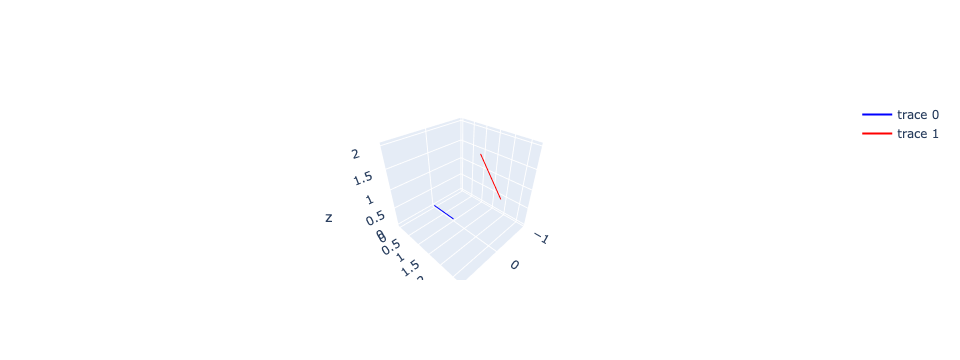

In [29]:
def render_rays_and_segments(rays: Tensor, segments: Tensor):
    """
    rays: shape (nrays, num_points=2, num_dim=3) where the num_points dimension contains
        (origin, direction) and the num_dim dimension contains xyz.
    segments: shape (nsegments, num_points=2, num_dim=3) where the num_points dimension contains
        (p1, p2) and the num_dim dimension contains xyz.
    Returns: A plotly figure with the rays rendered as lines.
    """
    nrays = rays.shape[0]
    nsegments = segments.shape[0]
    
    fig = go.Figure()
    for i in range(nrays):
        origin = rays[i, 0]  # shape (num_dim,)
        direction = rays[i, 1]  # shape (num_dim,)
        line_x = [origin[0].item(), origin[0].item() + direction[0].item()]
        line_y = [origin[1].item(), origin[1].item() + direction[1].item()]
        line_z = [origin[2].item(), origin[2].item() + direction[2].item()]
        fig.add_trace(go.Scatter3d(x=line_x, y=line_y, z=line_z, mode='lines', line={'color':'blue'}))

    for j in range(nsegments):
        p1 = segments[j, 0]  # shape (num_dim,)
        p2 = segments[j, 1]  # shape (num_dim,)

        # Vector from L1 to L2
        seg_vec = p2 - p1
        seg_len = t.norm(seg_vec)
        seg_dir = seg_vec / seg_len  # Normalize to get direction

        origin, direction = p1, seg_dir
        line_x = [origin[0].item(), origin[0].item() + direction[0].item()]
        line_y = [origin[1].item(), origin[1].item() + direction[1].item()]
        line_z = [origin[2].item(), origin[2].item() + direction[2].item()]
        fig.add_trace(go.Scatter3d(x=line_x, y=line_y, z=line_z, mode='lines', line={'color':'red'}))
    
    fig.update_layout(scene=dict(aspectmode='cube'))
    fig.show()



rays = t.tensor([[[0.0, 0.0, 0.0], [0.0, 1.0, 0.0]]])
segments = t.tensor(  [[[0.0, 2.0, 2.0], [0.0, 4.0, 0.0]],])

render_rays_and_segments(rays, segments)

## Solution

In [28]:
def intersect_rays_1d(
    rays: Float[Tensor, "nrays 2 3"], segments: Float[Tensor, "nsegments 2 3"]
) -> Bool[Tensor, " nrays"]:
    """
    For each ray, return True if it intersects any segment.
    """
    NR = rays.size(0)
    NS = segments.size(0)

    # Get just the x and y coordinates
    rays = rays[..., :2]
    segments = segments[..., :2]

    # Repeat rays and segments so that we can compuate the intersection of every (ray, segment) pair
    rays = einops.repeat(rays, "nrays p d -> nrays nsegments p d", nsegments=NS)
    segments = einops.repeat(segments, "nsegments p d -> nrays nsegments p d", nrays=NR)

    # Each element of `rays` is [[Ox, Oy], [Dx, Dy]]
    O = rays[:, :, 0]
    D = rays[:, :, 1]
    assert O.shape == (NR, NS, 2)

    # Each element of `segments` is [[L1x, L1y], [L2x, L2y]]
    L_1 = segments[:, :, 0]
    L_2 = segments[:, :, 1]
    assert L_1.shape == (NR, NS, 2)

    # Define matrix on left hand side of equation
    mat = t.stack([D, L_1 - L_2], dim=-1)
    # Get boolean of where matrix is singular, and replace it with the identity in these positions
    dets = t.linalg.det(mat)
    is_singular = dets.abs() < 1e-8
    assert is_singular.shape == (NR, NS)
    mat[is_singular] = t.eye(2)

    # Define vector on the right hand side of equation
    vec = L_1 - O

    # Solve equation, get results
    sol = t.linalg.solve(mat, vec)
    u = sol[..., 0]
    v = sol[..., 1]

    out = ((u >= 0) & (v >= 0) & (v <= 1))
    print(out)
    # Return boolean of (matrix is nonsingular, and soln is in correct range implying intersection)
    return ((u >= 0) & (v >= 0) & (v <= 1)).any(dim=-1) #& ~is_singular).any(dim=-1)


tests.test_intersect_rays_1d(intersect_rays_1d)
tests.test_intersect_rays_1d_special_case(intersect_rays_1d)


tensor([[ True, False, False],
        [ True, False, False],
        [False, False, False],
        [False, False, False],
        [False, False, False],
        [False, False, False],
        [False, False, False],
        [False, False,  True],
        [False, False,  True]])
All tests in `test_intersect_rays_1d` passed!
tensor([[False, False],
        [False,  True]])
All tests in `test_intersect_rays_1d_special_case` passed!


# Make rays 2d

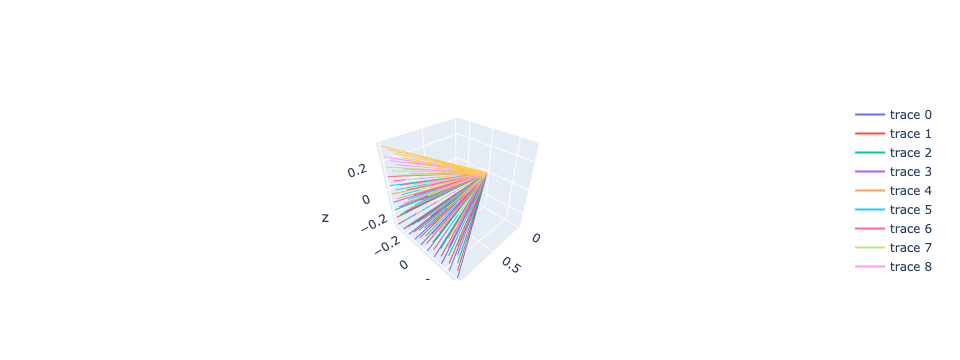

In [44]:
def make_rays_2d(num_pixels_y: int, num_pixels_z: int, y_limit: float, z_limit: float) -> Float[Tensor, "nrays 2 3"]:
    """
    num_pixels_y: The number of pixels in the y dimension
    num_pixels_z: The number of pixels in the z dimension

    y_limit: At x=1, the rays should extend from -y_limit to +y_limit, inclusive of both.
    z_limit: At x=1, the rays should extend from -z_limit to +z_limit, inclusive of both.

    Returns: shape (num_rays=num_pixels_y * num_pixels_z, num_points=2, num_dims=3).
    """
    num_pixels = num_pixels_y*num_pixels_z
    origins = np.zeros((num_pixels, 3))  # shape (num_pixels, num_dim)
    y_values = np.linspace(-y_limit, y_limit, num_pixels_y)  # shape (num_pixels_y,)
    z_values = np.linspace(-z_limit, z_limit, num_pixels_z)  # shape (num_pixels_z,)
    dirs = []
    for y,z in itertools.product(y_values, z_values):
        dirs.append([1,y,z])
    directions = np.stack(dirs, axis=-1).T  # shape (num_pixels, num_dim)
    rays = np.stack([origins, directions], axis=1)  # shape (num_pixels, num_points=2, num_dim=3)
    return Tensor(rays)


rays_2d = make_rays_2d(10, 10, 0.3, 0.3)
render_lines_with_plotly(rays_2d)

# III. Triangles

In [45]:
one_triangle = t.tensor([[0, 0, 0], [4, 0.5, 0], [2, 3, 0]])
A, B, C = one_triangle
x, y, z = one_triangle.T

fig: go.FigureWidget = setup_widget_fig_triangle(x, y, z)
display(fig)


@interact(u=(-0.5, 1.5, 0.01), v=(-0.5, 1.5, 0.01))
def update(u=0.0, v=0.0):
    P = A + u * (B - A) + v * (C - A)
    fig.update_traces({"x": [P[0]], "y": [P[1]]}, 2)

FigureWidget({
    'data': [{'marker': {'size': 12},
              'mode': 'markers+text',
              'text': [A, B, C],
              'textfont': {'size': 18},
              'textposition': 'middle left',
              'type': 'scatter',
              'uid': '6d25f182-7106-44e4-90df-16782e415e96',
              'x': {'bdata': 'AAAAAAAAgEAAAABA', 'dtype': 'f4'},
              'y': {'bdata': 'AAAAAAAAAD8AAEBA', 'dtype': 'f4'}},
             {'mode': 'lines',
              'type': 'scatter',
              'uid': 'a6c4d72b-6bd5-40f1-95fc-b32e9a6e745e',
              'x': [0.0, 4.0, 2.0, 0.0],
              'y': [0.0, 0.5, 3.0, 0.0]},
             {'marker': {'size': 12, 'symbol': 'x'},
              'mode': 'markers',
              'type': 'scatter',
              'uid': '608dda25-e109-45d9-9b2b-9f7e731071bf',
              'x': [],
              'y': []}],
    'layout': {'height': 400,
               'margin': {'b': 10, 'l': 40, 't': 60},
               'showlegend': False,
          

interactive(children=(FloatSlider(value=0.0, description='u', max=1.5, min=-0.5, step=0.01), FloatSlider(value…

## Triangle ray intersect

In [65]:
Point = Float[Tensor, "points=3"]


def triangle_ray_intersects(A: Point, B: Point, C: Point, O: Point, D: Point) -> bool:
    """
    A: shape (3,), one vertex of the triangle
    B: shape (3,), second vertex of the triangle
    C: shape (3,), third vertex of the triangle
    O: shape (3,), origin point
    D: shape (3,), direction point

    Return True if the ray and the triangle intersect.
    """
    lhs = t.stack([-D, B-A, C-A], dim=1)
    rhs = O-A
    result, info = t.linalg.solve_ex(lhs, rhs)
    s, u, v = result
    #print(s.item(), u.item(), v.item())
    
    #if solve returned an error, not solvable
    if info.item()!=0:
        return False

    return ((s>0) & (v>=0) & (u>=0) & (u+v<=1))


tests.test_triangle_ray_intersects(triangle_ray_intersects)

All tests in `test_triangle_ray_intersects` passed!


## Ray trace triangle

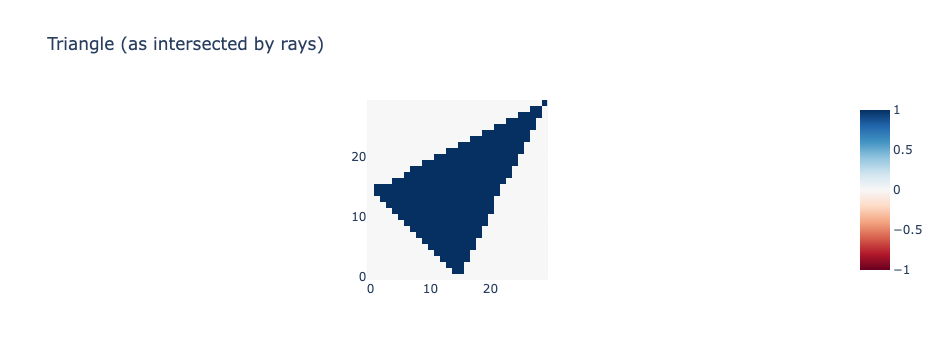

In [67]:
def raytrace_triangle(
    rays: Float[Tensor, "nrays rayPoints=2 dims=3"],
    triangle: Float[Tensor, "trianglePoints=3 dims=3"],
) -> Bool[Tensor, " nrays"]:
    """
    For each ray, return True if the triangle intersects that ray.
    """
    A,B,C = triangle
    intersects = []
    for ray in rays:
        O,D = ray
        intersects.append(triangle_ray_intersects(A,B,C,O,D))
    return t.Tensor(intersects)


A = t.tensor([1, 0.0, -0.5])
B = t.tensor([1, -0.5, 0.0])
C = t.tensor([1, 0.5, 0.5])
num_pixels_y = num_pixels_z = 30
y_limit = z_limit = 0.5

# Plot triangle & rays
test_triangle = t.stack([A, B, C], dim=0)
rays2d = make_rays_2d(num_pixels_y, num_pixels_z, y_limit, z_limit)
triangle_lines = t.stack([A, B, C, A, B, C], dim=0).reshape(-1, 2, 3)
render_lines_with_plotly(rays2d)#, triangle_lines)

# Calculate and display intersections
intersects = raytrace_triangle(rays2d, test_triangle)
img = intersects.reshape(num_pixels_y, num_pixels_z).int()
imshow(img, origin="lower", width=600, title="Triangle (as intersected by rays)")


## Mesh rendering

In [68]:
triangles = t.load(section_dir / "pikachu.pt", weights_only=True)

In [69]:
triangles.shape

torch.Size([412, 3, 3])

In [75]:
Point = Float[Tensor, "points=3"]


def triangle_ray_intersection(A: Point, B: Point, C: Point, O: Point, D: Point) -> bool:
    """
    A: shape (3,), one vertex of the triangle
    B: shape (3,), second vertex of the triangle
    C: shape (3,), third vertex of the triangle
    O: shape (3,), origin point
    D: shape (3,), direction point

    Return Tuple (bool, dist) where bool is true if the ray and the triangle intersect, and dist is the distance to O, or infinity.
    """
    lhs = t.stack([-D, B-A, C-A], dim=1)
    rhs = O-A
    result, info = t.linalg.solve_ex(lhs, rhs)
    s, u, v = result
    #print(s.item(), u.item(), v.item())
    
    #if solve returned an error, not solvable
    if info.item()!=0:
        return False, float("inf")

    cross = (s>0) & (v>=0) & (u>=0) & (u+v<=1)
    dist = np.linalg.norm((s * D)-O) if cross else float("inf")
    return cross, dist 



def raytrace_mesh(
    rays: Float[Tensor, "nrays rayPoints=2 dims=3"],
    triangles: Float[Tensor, "ntriangles trianglePoints=3 dims=3"],
) -> Float[Tensor, " nrays"]:
    """
    For each ray, return the distance to the closest intersecting triangle, or infinity.
    """
    nr, nt = rays.shape[0], triangles.shape[0]
    dists = t.ones((nr, nt))*float("inf")
    for i,j in itertools.product(range(nr), range(nt)):
        O, D = rays[i]
        A,B,C = triangles[j]
        _,d = triangle_ray_intersection(A,B,C,O,D)
        dists[i,j] = float(d)
    return t.min(dists)


num_pixels_y = 120
num_pixels_z = 120
y_limit = z_limit = 1

rays = make_rays_2d(num_pixels_y, num_pixels_z, y_limit, z_limit)
rays[:, 0] = t.tensor([-2, 0.0, 0.0])
dists = raytrace_mesh(rays, triangles)
intersects = t.isfinite(dists).view(num_pixels_y, num_pixels_z)
dists_square = dists.view(num_pixels_y, num_pixels_z)
img = t.stack([intersects, dists_square], dim=0)

fig = px.imshow(img, facet_col=0, origin="lower", color_continuous_scale="magma", width=1000)
fig.update_layout(coloraxis_showscale=False)
for i, text in enumerate(["Intersects", "Distance"]):
    fig.layout.annotations[i]["text"] = text
fig.show()


TypeError: can't assign a numpy.float32 to a torch.FloatTensor

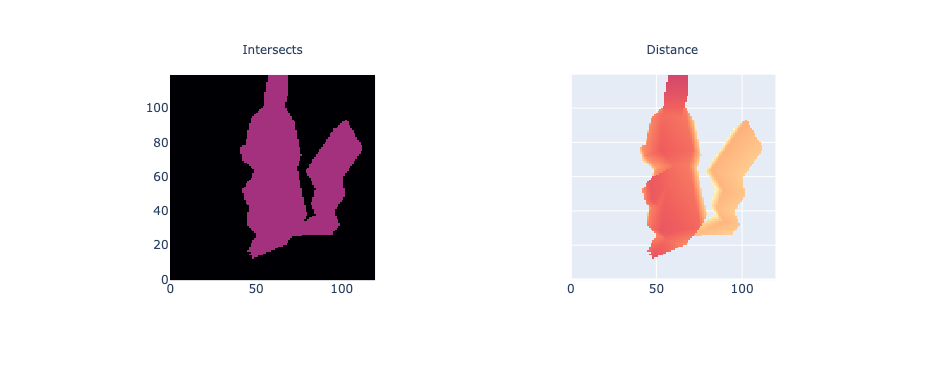

In [78]:
# Improved with Claude

def raytrace_mesh(
    rays: Float[Tensor, "nrays rayPoints=2 dims=3"],
    triangles: Float[Tensor, "ntriangles trianglePoints=3 dims=3"],
) -> Float[Tensor, " nrays"]:
    """
    For each ray, return the distance to the closest intersecting triangle, or infinity.
    """
    NR, NT = rays.shape[0], triangles.shape[0]

    # Broadcast rays and triangles to all (ray, triangle) pairs
    # Shape: (NR, NT, 3)
    O = einops.repeat(rays[:, 0], "nr d -> nr nt d", nt=NT)
    D = einops.repeat(rays[:, 1], "nr d -> nr nt d", nt=NT)
    A = einops.repeat(triangles[:, 0], "nt d -> nr nt d", nr=NR)
    B = einops.repeat(triangles[:, 1], "nt d -> nr nt d", nr=NR)
    C = einops.repeat(triangles[:, 2], "nt d -> nr nt d", nr=NR)

    # Möller–Trumbore: solve [−D | B−A | C−A] [t, u, v]ᵀ = O−A
    # mat shape: (NR, NT, 3, 3)
    mat = t.stack([-D, B - A, C - A], dim=-1)
    vec = O - A  # (NR, NT, 3)

    # Mask out singular (degenerate/parallel) systems
    dets = t.linalg.det(mat)                   # (NR, NT)
    is_singular = dets.abs() < 1e-8
    mat[is_singular] = t.eye(3)                # safe dummy, results masked out later

    # Solve all systems at once
    sol = t.linalg.solve(mat, vec)             # (NR, NT, 3)
    T = sol[..., 0]   # ray parameter  (distance)
    u = sol[..., 1]   # barycentric u
    v = sol[..., 2]   # barycentric v

    # Valid intersection: non-singular, ray goes forward, inside triangle
    valid = ~is_singular & (T >= 0) & (u >= 0) & (v >= 0) & (u + v <= 1)

    # Replace invalid entries with inf, then take per-ray minimum
    dists = t.where(valid, T, t.tensor(float("inf")))  # (NR, NT)
    return dists.min(dim=-1).values                     # (NR,)

num_pixels_y = 120
num_pixels_z = 120
y_limit = z_limit = 1

rays = make_rays_2d(num_pixels_y, num_pixels_z, y_limit, z_limit)
rays[:, 0] = t.tensor([-2, 0.0, 0.0])
dists = raytrace_mesh(rays, triangles)
intersects = t.isfinite(dists).view(num_pixels_y, num_pixels_z)
dists_square = dists.view(num_pixels_y, num_pixels_z)
img = t.stack([intersects, dists_square], dim=0)

fig = px.imshow(img, facet_col=0, origin="lower", color_continuous_scale="magma", width=1000)
fig.update_layout(coloraxis_showscale=False)
for i, text in enumerate(["Intersects", "Distance"]):
    fig.layout.annotations[i]["text"] = text
fig.show()

In [91]:
t.linalg.det(t.ones(3,3).to(float))

tensor(0., dtype=torch.float64)

# Video lighting

In [93]:
def rotation_matrix(theta: Float[Tensor, ""]) -> Float[Tensor, "rows cols"]:
    """
    Creates a rotation matrix representing a counterclockwise rotation of `theta` around the y-axis.
    """
    return t.Tensor([[t.cos(theta), 0, t.sin(theta)], [0,1,0], [-t.sin(theta), 0, t.cos(theta)]])


tests.test_rotation_matrix(rotation_matrix)


All tests in `test_rotation_matrix` passed!


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [11:47<00:00, 14.15s/it]


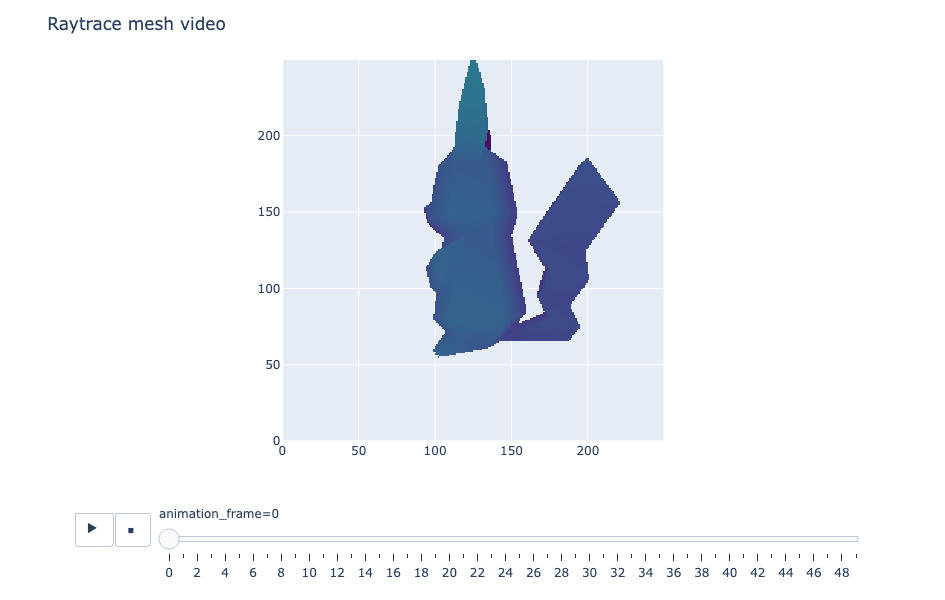

In [94]:
def raytrace_mesh_video(
    rays: Float[Tensor, "nrays points dim"],
    triangles: Float[Tensor, "ntriangles points dims"],
    rotation_matrix: Callable[[float], Float[Tensor, "rows cols"]],
    raytrace_function: Callable,
    num_frames: int,
) -> Bool[Tensor, "nframes nrays"]:
    """
    Creates a stack of raytracing results, rotating the triangles by `rotation_matrix` each frame.
    """
    result = []
    theta = t.tensor(2 * t.pi) / num_frames
    R = rotation_matrix(theta)
    for theta in tqdm(range(num_frames)):
        triangles = triangles @ R
        result.append(raytrace_function(rays, triangles))
        t.cuda.empty_cache()  # clears GPU memory (this line will be more important later on!)
    return t.stack(result, dim=0)


def display_video(distances: Float[Tensor, "frames y z"]):
    """
    Displays video of raytracing results, using Plotly. `distances` is a tensor where the [i, y, z]
    element is distance to the closest triangle for the i-th frame & the [y, z]-th ray in our 2D
    grid of rays.
    """
    px.imshow(
        distances,
        animation_frame=0,
        origin="lower",
        zmin=0.0,
        zmax=distances[distances.isfinite()].quantile(0.99).item(),
        color_continuous_scale="viridis_r",  # "Brwnyl"
    ).update_layout(coloraxis_showscale=False, width=550, height=600, title="Raytrace mesh video").show()


num_pixels_y = 250
num_pixels_z = 250
y_limit = z_limit = 0.8
num_frames = 50

rays = make_rays_2d(num_pixels_y, num_pixels_z, y_limit, z_limit)
rays[:, 0] = t.tensor([-3.0, 0.0, 0.0])
dists = raytrace_mesh_video(rays, triangles, rotation_matrix, raytrace_mesh, num_frames)
dists = einops.rearrange(dists, "frames (y z) -> frames y z", y=num_pixels_y)

display_video(dists)


In [ ]:
def raytrace_mesh_gpu(
    rays: Float[Tensor, "nrays rayPoints=2 dims=3"],
    triangles: Float[Tensor, "ntriangles trianglePoints=3 dims=3"],
) -> Float[Tensor, " nrays"]:
    """
    For each ray, return the distance to the closest intersecting triangle, or infinity.

    All computations should be performed on the GPU.
    """
    device="gpu"
    NR, NT = rays.shape[0], triangles.shape[0]

    # Broadcast rays and triangles to all (ray, triangle) pairs
    # Shape: (NR, NT, 3)
    O = einops.repeat(rays[:, 0], "nr d -> nr nt d", nt=NT)
    D = einops.repeat(rays[:, 1], "nr d -> nr nt d", nt=NT)
    A = einops.repeat(triangles[:, 0], "nt d -> nr nt d", nr=NR)
    B = einops.repeat(triangles[:, 1], "nt d -> nr nt d", nr=NR)
    C = einops.repeat(triangles[:, 2], "nt d -> nr nt d", nr=NR)

    # Möller–Trumbore: solve [−D | B−A | C−A] [t, u, v]ᵀ = O−A
    # mat shape: (NR, NT, 3, 3)
    mat = t.stack([-D, B - A, C - A], dim=-1)
    vec = O - A  # (NR, NT, 3)

    #move to gpu for efficency
    mat.to(device)
    vec.to(device)
    
    # Mask out singular (degenerate/parallel) systems
    dets = t.linalg.det(mat)                   # (NR, NT)
    is_singular = dets.abs() < 1e-8
    mat[is_singular] = t.eye(3)                # safe dummy, results masked out later
    
    # Solve all systems at once
    sol = t.linalg.solve(mat, vec)             # (NR, NT, 3)
    T = sol[..., 0]   # ray parameter  (distance)
    u = sol[..., 1]   # barycentric u
    v = sol[..., 2]   # barycentric v

    # Valid intersection: non-singular, ray goes forward, inside triangle
    valid = ~is_singular & (T >= 0) & (u >= 0) & (v >= 0) & (u + v <= 1)

    # Replace invalid entries with inf, then take per-ray minimum
    dists = t.where(valid, T, t.tensor(float("inf")))  # (NR, NT)
    min_dists = dists.min(dim=-1).values               # (NR,)
    return min_dists.cpu()
    


dists = raytrace_mesh_video(rays, triangles, rotation_matrix, raytrace_mesh_gpu, num_frames)
dists = einops.rearrange(dists, "frames (y z) -> frames y z", y=num_pixels_y)
display_video(dists)
